# 🔍 SAM 3 Lab 5 — Object Search by Click
## คลิกเลือก Object → ค้นหา Object ที่คล้ายกันข้ามรูปภาพ

---

## 📚 สารบัญ (Table of Contents)

| Step | หัวข้อ | สิ่งที่จะได้เรียนรู้ |
|------|--------|---------------------|
| **5.1** | Setup & เตรียมข้อมูล | โหลด model, สร้าง image gallery ใน pandas |
| **5.2** | คลิกเลือก Object | ใช้ point prompt เพื่อ segment object ที่ต้องการ |
| **5.3** | สกัด Feature Vector | ดึง embedding จาก object ที่เลือก |
| **5.4** | ค้นหาข้ามรูปภาพ | เปรียบเทียบ similarity กับ object ในรูปอื่นๆ |
| **5.5** | แสดงผล Similarity | Visualize ผลการค้นหาแบบ ranking |

---

## 🤔 แนวคิดหลัก (Core Idea)

```
┌──────────────────────────────────────────────────────────┐
│  1. เลือกรูปจาก gallery (pandas DataFrame)              │
│  2. คลิก point บน object ที่สนใจ                        │
│  3. SAM 3 segment object → ได้ mask                     │
│  4. สกัด feature vector จาก masked region               │
│  5. วน loop ค้นหา object เดียวกันในรูปอื่นๆ             │
│  6. จัดอันดับ similarity → แสดงผลลัพธ์                   │
└──────────────────────────────────────────────────────────┘
```

### วิธีวัด Similarity
เราใช้ **Cosine Similarity** ระหว่าง feature vectors:
```
             A · B
cos(θ) = ─────────── = 1.0 (เหมือนกันเป๊ะ) ... 0.0 (ไม่เกี่ยวกันเลย)
          ‖A‖ × ‖B‖
```

---
# 🟢 Step 5.1: Setup & เตรียมข้อมูลใน Pandas

### 🎯 เป้าหมาย
1. โหลด SAM 3 model ทั้ง 2 ตัว (Text + Tracker)
2. โหลด FoodSeg103 dataset
3. สร้าง **pandas DataFrame** เป็น gallery สำหรับเลือกรูป

In [1]:
# ============================================================
# Step 5.1.1: Import libraries
# ============================================================
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image as PILImage
from datasets import load_dataset
from transformers import (
    Sam3Processor, Sam3Model,
    Sam3TrackerProcessor, Sam3TrackerModel,
)
from scipy import ndimage
from sklearn.metrics.pairwise import cosine_similarity
import torchvision.transforms as T
import random
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

# --- GPU Check ---
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"🖥️  Using device: {device}")
if torch.cuda.is_available():
    print(f"   GPU: {torch.cuda.get_device_name(0)}")

🖥️  Using device: cuda
   GPU: NVIDIA RTX PRO 6000 Blackwell Workstation Edition


In [2]:
# ============================================================
# Step 5.1.2: โหลด SAM 3 Models (Text + Tracker)
# ============================================================
# Text model  → ใช้สกัด vision features (embedding)
# Tracker model → ใช้ segment จาก point click

print("⏳ Loading SAM 3 models...")

# --- Text/Vision Model (สำหรับ feature extraction) ---
processor = Sam3Processor.from_pretrained("facebook/sam3")
model = Sam3Model.from_pretrained("facebook/sam3").to(device)
model.eval()

# --- Tracker Model (สำหรับ point click segmentation) ---
tracker_processor = Sam3TrackerProcessor.from_pretrained("facebook/sam3")
tracker_model = Sam3TrackerModel.from_pretrained("facebook/sam3").to(device)
tracker_model.eval()

print("✅ Both models loaded!")

⏳ Loading SAM 3 models...


Loading weights:   0%|          | 0/1468 [00:00<?, ?it/s]

You are using a model of type sam3_video to instantiate a model of type sam3_tracker. This is not supported for all configurations of models and can yield errors.


Loading weights:   0%|          | 0/685 [00:00<?, ?it/s]

✅ Both models loaded!


In [3]:
# ============================================================
# Step 5.1.3: โหลด FoodSeg103 Dataset
# ============================================================
print("⏳ Loading FoodSeg103 dataset...")
ds = load_dataset("EduardoPacheco/FoodSeg103", split="train")
print(f"✅ Dataset loaded: {len(ds):,} images")

⏳ Loading FoodSeg103 dataset...
✅ Dataset loaded: 4,983 images


In [4]:
# ============================================================
# Step 5.1.4: Food Category Labels
# ============================================================
FOODSEG103_LABELS = {
    0: "background", 1: "candy", 2: "egg tart", 3: "french fries", 4: "chocolate",
    5: "biscuit", 6: "popcorn", 7: "pudding", 8: "ice cream", 9: "cheese butter",
    10: "cake", 11: "wine", 12: "milkshake", 13: "coffee", 14: "juice",
    15: "milk", 16: "tea", 17: "almond", 18: "red beans", 19: "cashew",
    20: "dried cranberries", 21: "soy", 22: "walnut", 23: "peanut", 24: "egg",
    25: "apple", 26: "date", 27: "apricot", 28: "avocado", 29: "banana",
    30: "strawberry", 31: "cherry", 32: "blueberry", 33: "raspberry", 34: "mango",
    35: "olives", 36: "peach", 37: "lemon", 38: "pear", 39: "fig",
    40: "pineapple", 41: "grape", 42: "kiwi", 43: "melon", 44: "orange",
    45: "watermelon", 46: "steak", 47: "pork", 48: "chicken duck", 49: "sausage",
    50: "fried meat", 51: "lamb", 52: "sauce", 53: "crab", 54: "fish",
    55: "shellfish", 56: "shrimp", 57: "squid", 58: "bread", 59: "corn",
    60: "dumpling", 61: "hamburger", 62: "pizza", 63: "hanamaki baozi",
    64: "wonton", 65: "pasta", 66: "rice", 67: "noodles", 68: "soup",
    69: "cake", 70: "hotdog", 71: "spring roll", 72: "tofu", 73: "asparagus",
    74: "broccoli", 75: "Brussels sprout", 76: "cabbage", 77: "carrot",
    78: "celery", 79: "corn", 80: "cucumber", 81: "eggplant",
    82: "garlic", 83: "ginger", 84: "lettuce", 85: "mushroom",
    86: "onion", 87: "pepper", 88: "potato", 89: "pumpkin",
    90: "sweet potato", 91: "tomato", 92: "bean sprouts", 93: "green beans",
    94: "spinach", 95: "bell pepper", 96: "white radish", 97: "kidney beans",
    98: "mixed vegetables", 99: "crispy chicken", 100: "chicken wings",
    101: "french beans", 102: "other ingredients", 103: "salad",
}
LABEL_TO_ID = {name: cid for cid, name in FOODSEG103_LABELS.items()}


def get_class_names(class_ids):
    """แปลง class IDs → ชื่ออาหาร"""
    return [FOODSEG103_LABELS.get(c, f"unknown_{c}") for c in class_ids]


print(f"✅ {len(FOODSEG103_LABELS)} food categories loaded")

✅ 104 food categories loaded


In [5]:
# ============================================================
# Step 5.1.5: สร้าง Image Gallery ใน Pandas DataFrame
# ============================================================
# สร้าง DataFrame ที่เก็บข้อมูลรูปภาพ เพื่อให้นักศึกษาเลือกรูปจาก table ได้ง่าย
#
# 💡 เราเลือกเฉพาะรูปที่มี "egg" เพื่อใช้เป็นตัวอย่าง
#    (เปลี่ยนเป็น food class อื่นได้ เช่น "tomato", "rice")

TARGET_FOOD = "egg"
TARGET_ID = LABEL_TO_ID[TARGET_FOOD]

print(f'🔍 กำลังค้นหารูปที่มี "{TARGET_FOOD}" ใน dataset...')

# --- สุ่มเลือกรูปที่มี target food ---
gallery_records = []
indices = list(range(len(ds)))
random.seed(42)  # ให้ได้ผลเหมือนกันทุกครั้ง
random.shuffle(indices)

MAX_GALLERY = 20  # จำนวนรูปใน gallery

for idx in indices:
    if len(gallery_records) >= MAX_GALLERY:
        break
    sample = ds[idx]
    if TARGET_ID in sample["classes_on_image"]:
        names = get_class_names(sample["classes_on_image"])
        food_names = [n for n in names if n != "background"]
        gallery_records.append({
            "gallery_id": len(gallery_records),
            "dataset_idx": idx,
            "food_classes": ", ".join(food_names),
            "num_classes": len(food_names),
            "image_size": f"{sample['image'].size[0]}×{sample['image'].size[1]}",
        })

# --- สร้าง DataFrame ---
df_gallery = pd.DataFrame(gallery_records)

print(f"\n✅ สร้าง Gallery สำเร็จ: {len(df_gallery)} รูปที่มี '{TARGET_FOOD}'")
print("\n📋 Image Gallery DataFrame:")
df_gallery

🔍 กำลังค้นหารูปที่มี "egg" ใน dataset...

✅ สร้าง Gallery สำเร็จ: 20 รูปที่มี 'egg'

📋 Image Gallery DataFrame:


,gallery_id,dataset_idx,food_classes,num_classes,image_size
0,0,3005,"egg, steak, green beans, spinach, white radish",5,1522×1634
1,1,3140,"soy, egg, steak, sausage, bread, french beans",6,512×384
2,2,2838,"egg, garlic, spinach",3,256×256
3,3,4194,"coffee, juice, egg, chicken duck, bread, green...",6,512×384
4,4,2414,"egg, sauce, asparagus, cucumber",4,512×384
5,5,388,"egg, steak, bread, green beans",4,512×384
6,6,4256,"egg, steak, corn",3,256×256
7,7,4374,"egg, bread, mushroom",3,1923×2250
8,8,1096,"cheese butter, egg, banana, sausage, sauce, br...",7,642×428
9,9,2720,"red beans, egg, avocado, chicken duck, corn, c...",8,512×384


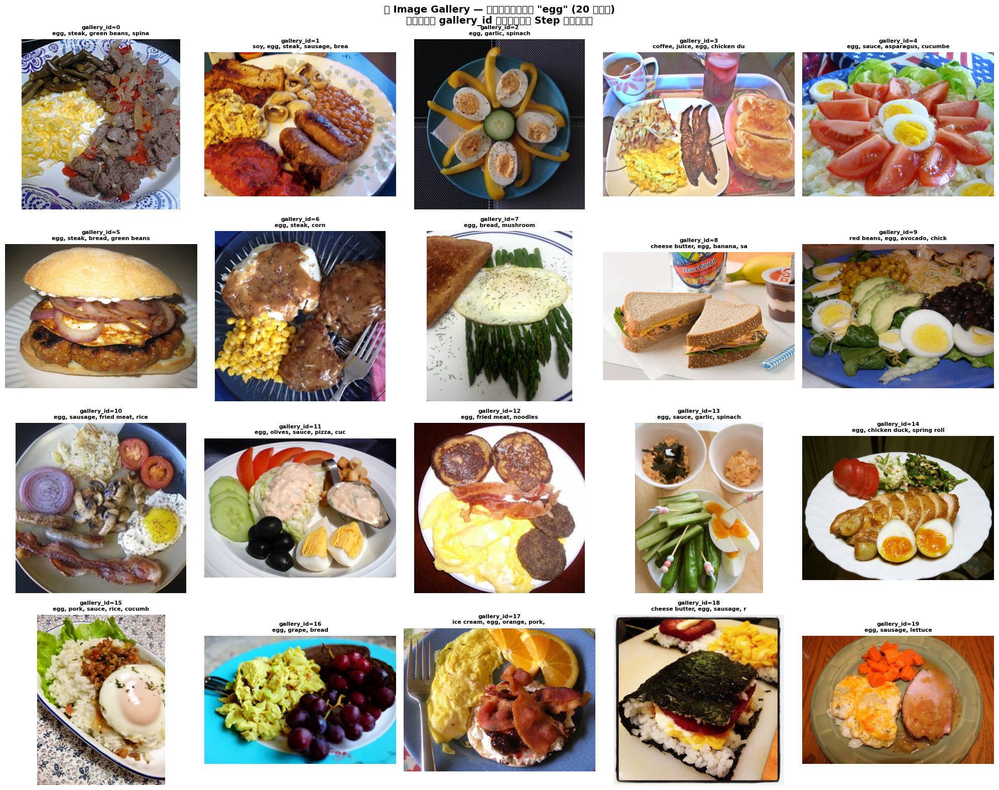

💡 จด gallery_id ของรูปที่ต้องการคลิก แล้วใช้ใน Step 5.2


In [6]:
# ============================================================
# Step 5.1.6: แสดง Gallery เป็น Grid
# ============================================================
# แสดงรูปทั้งหมดใน gallery เพื่อให้เลือกรูปที่จะคลิก

cols = 5
rows = (len(df_gallery) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
axes_flat = axes.flatten()

for i, (_, row) in enumerate(df_gallery.iterrows()):
    ax = axes_flat[i]
    img = ds[row["dataset_idx"]]["image"]
    ax.imshow(img)
    ax.set_title(f"gallery_id={row['gallery_id']}\n{row['food_classes'][:30]}",
                 fontsize=8, fontweight="bold")
    ax.axis("off")

# ซ่อน axes ที่เหลือ
for j in range(len(df_gallery), len(axes_flat)):
    axes_flat[j].axis("off")

plt.suptitle(f'🖼️ Image Gallery — รูปที่มี "{TARGET_FOOD}" ({len(df_gallery)} รูป)\n'
             f'เลือก gallery_id สำหรับ Step ถัดไป', fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

print("💡 จด gallery_id ของรูปที่ต้องการคลิก แล้วใช้ใน Step 5.2")

---
# 🟢 Step 5.2: คลิกเลือก Object จากรูปที่เลือก

### 🎯 เป้าหมาย
1. เลือกรูปจาก gallery โดยใช้ `gallery_id`
2. ดู coordinate grid เพื่อหาตำแหน่ง (x, y)
3. คลิก point → SAM 3 segment object → ได้ mask

### 💡 วิธีการ
```
เลือกรูป (gallery_id) → ดู grid → เลือก (x,y) → SAM 3 segment
```

In [7]:
# ============================================================
# Step 5.2.1: เลือกรูปจาก Gallery
# ============================================================
# ⬇️ เปลี่ยน SELECTED_GALLERY_ID เพื่อเลือกรูปอื่น
SELECTED_GALLERY_ID = 0

# --- ดึงข้อมูลจาก DataFrame ---
selected_row = df_gallery[df_gallery["gallery_id"] == SELECTED_GALLERY_ID].iloc[0]
selected_ds_idx = selected_row["dataset_idx"]

sample = ds[selected_ds_idx]
query_image = sample["image"].convert("RGB")
img_w, img_h = query_image.size

print(f"📷 เลือกรูป gallery_id = {SELECTED_GALLERY_ID}")
print(f"   Dataset index : {selected_ds_idx}")
print(f"   Image size    : {img_w} × {img_h}")
print(f"   Food classes  : {selected_row['food_classes']}")

📷 เลือกรูป gallery_id = 0
   Dataset index : 3005
   Image size    : 1522 × 1634
   Food classes  : egg, steak, green beans, spinach, white radish


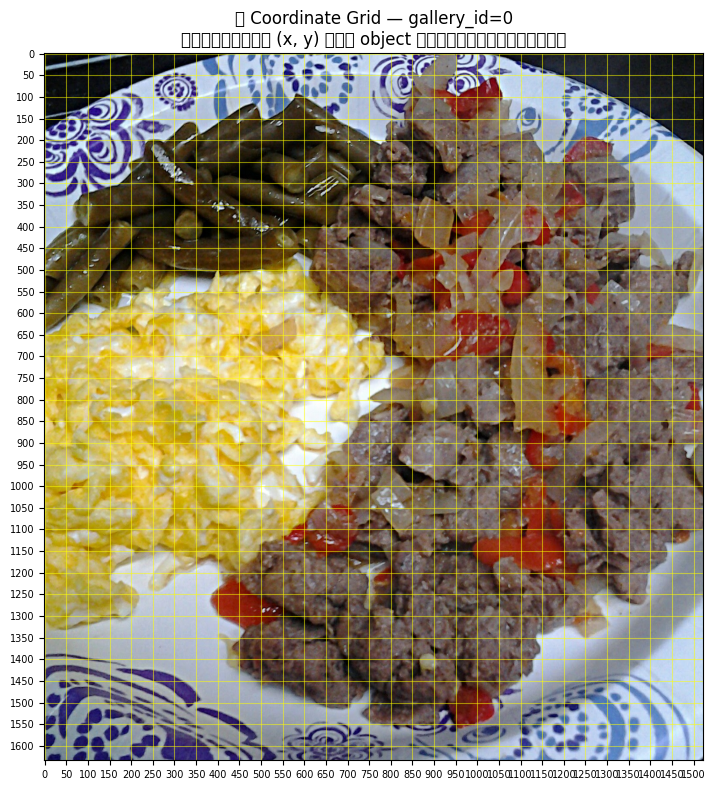

💡 Tips: ดูตำแหน่ง (x, y) จาก grid แล้วใส่ใน CLICK_POINT ด้านล่าง


In [8]:
# ============================================================
# Step 5.2.2: แสดง Coordinate Grid เพื่อเลือกตำแหน่งคลิก
# ============================================================
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(query_image)
ax.set_title(f"📍 Coordinate Grid — gallery_id={SELECTED_GALLERY_ID}\n"
             f"จดตำแหน่ง (x, y) ของ object ที่ต้องการค้นหา", fontsize=12)
ax.set_xticks(range(0, img_w, 50))
ax.set_yticks(range(0, img_h, 50))
ax.grid(alpha=0.5, color="yellow", linewidth=0.8)
ax.tick_params(labelsize=7)
plt.tight_layout()
plt.show()

print("💡 Tips: ดูตำแหน่ง (x, y) จาก grid แล้วใส่ใน CLICK_POINT ด้านล่าง")

In [9]:
# ============================================================
# Step 5.2.3: คลิก Point → Segment Object
# ============================================================
# ⬇️ เปลี่ยนค่า CLICK_POINT เป็นตำแหน่ง (x, y) ที่ต้องการ
CLICK_POINT = [300, 920]  # ← เปลี่ยนตรงนี้!

input_points = [[[[CLICK_POINT[0], CLICK_POINT[1]]]]]
input_labels = [[[1]]]  # 1 = positive point

print(f"📍 Click position: ({CLICK_POINT[0]}, {CLICK_POINT[1]})")
print("⏳ กำลัง segment...")

# --- Run SAM 3 Tracker ---
inputs = tracker_processor(
    images=query_image,
    input_points=input_points,
    input_labels=input_labels,
    return_tensors="pt",
).to(device)

with torch.no_grad():
    outputs = tracker_model(**inputs)

# --- Extract best mask ---
masks = outputs.pred_masks.squeeze().cpu().numpy()
scores = outputs.iou_scores.squeeze().cpu().numpy()
best_idx = scores.argmax()
best_mask = masks[best_idx]
best_score = scores[best_idx]

# Resize mask to image size
query_mask = np.array(
    PILImage.fromarray(best_mask.astype(np.float32)).resize((img_w, img_h))
) > 0

print(f"✅ Segment สำเร็จ!")
print(f"   Confidence score : {best_score:.4f}")
print(f"   Mask pixels      : {int(query_mask.sum()):,}")

📍 Click position: (300, 920)
⏳ กำลัง segment...
✅ Segment สำเร็จ!
   Confidence score : 0.9275
   Mask pixels      : 416,232


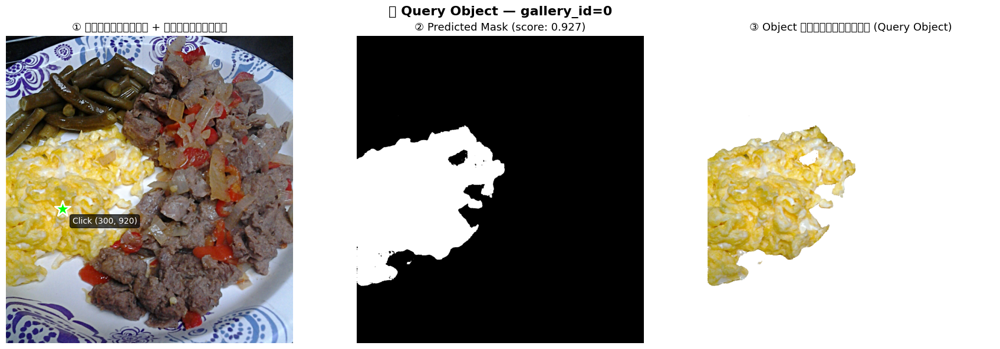

In [10]:
# ============================================================
# Step 5.2.4: แสดงผล Segmentation Result (3 panels)
# ============================================================
img_array = np.array(query_image)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Panel 1: รูปต้นฉบับ + จุดที่คลิก
axes[0].imshow(query_image)
axes[0].scatter(CLICK_POINT[0], CLICK_POINT[1], c="lime", s=400, marker="*",
                edgecolors="white", linewidths=2, zorder=5)
axes[0].annotate(f"Click ({CLICK_POINT[0]}, {CLICK_POINT[1]})",
                 (CLICK_POINT[0], CLICK_POINT[1]),
                 textcoords="offset points", xytext=(12, -18), fontsize=10,
                 color="white", bbox=dict(boxstyle="round", facecolor="black", alpha=0.7))
axes[0].set_title("① รูปต้นฉบับ + จุดที่คลิก", fontsize=13)
axes[0].axis("off")

# Panel 2: Mask ที่ได้
axes[1].imshow(query_mask, cmap="gray")
axes[1].set_title(f"② Predicted Mask (score: {best_score:.3f})", fontsize=13)
axes[1].axis("off")

# Panel 3: Extracted object (พื้นหลังขาว)
canvas = np.ones_like(img_array) * 255
canvas[query_mask] = img_array[query_mask]
axes[2].imshow(canvas)
axes[2].set_title("③ Object ที่ตัดออกมา (Query Object)", fontsize=13)
axes[2].axis("off")

plt.suptitle(f"🎯 Query Object — gallery_id={SELECTED_GALLERY_ID}",
             fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

---
# 🟢 Step 5.3: สกัด Feature Vector จาก Object

### 🎯 เป้าหมาย
สกัด **feature vector** (embedding) จาก object ที่ segment ได้
เพื่อใช้เป็น "ลายนิ้วมือ" ในการค้นหา object ที่คล้ายกัน

### 💡 แนวคิด
```
Object ที่ segment ได้
    ↓
Crop ตาม bounding box ของ mask
    ↓
ส่งเข้า SAM 3 Vision Encoder
    ↓
ได้ Feature Vector (embedding)
    ↓
ใช้เปรียบเทียบกับ object อื่นๆ
```

### วิธีสกัด Feature
เราใช้ **SAM 3 Vision Encoder** เพื่อสร้าง feature vector:
1. Crop รูปตาม bounding box ของ mask
2. Apply mask → เอาเฉพาะ pixel ที่เป็น object
3. ส่งผ่าน vision encoder → ได้ embedding
4. Global Average Pooling → ได้ vector 1 มิติ

In [11]:
# ============================================================
# Step 5.3.1: ฟังก์ชันสกัด Feature จาก Masked Region
# ============================================================

def extract_object_feature(image, mask, model, processor, device):
    """
    สกัด feature vector จาก object ที่ถูก mask

    Args:
        image: PIL Image (RGB)
        mask: boolean numpy array (H, W) — True = object pixel
        model: Sam3Model
        processor: Sam3Processor
        device: "cuda" or "cpu"

    Returns:
        feature_vector: numpy array shape (D,) — feature ของ object
    """
    img_array = np.array(image)
    img_h, img_w = img_array.shape[:2]

    # --- Step A: หา bounding box จาก mask ---
    ys, xs = np.where(mask)
    if len(ys) == 0:
        return np.zeros(256)  # empty mask → zero vector

    x1, y1, x2, y2 = int(xs.min()), int(ys.min()), int(xs.max()), int(ys.max())

    # เพิ่ม padding 10% รอบ bounding box
    pad_x = int((x2 - x1) * 0.1)
    pad_y = int((y2 - y1) * 0.1)
    x1 = max(0, x1 - pad_x)
    y1 = max(0, y1 - pad_y)
    x2 = min(img_w, x2 + pad_x)
    y2 = min(img_h, y2 + pad_y)

    # --- Step B: Crop + Apply mask ---
    cropped = img_array[y1:y2, x1:x2].copy()
    mask_crop = mask[y1:y2, x1:x2]

    # ตั้ง pixel ที่ไม่ใช่ object เป็นสีขาว (ลด noise จากพื้นหลัง)
    cropped[~mask_crop] = 255

    crop_pil = PILImage.fromarray(cropped)

    # --- Step C: ส่งผ่าน Vision Encoder ---
    inputs = processor(images=crop_pil, return_tensors="pt").to(device)
    with torch.no_grad():
        vision_output = model.get_vision_features(
            pixel_values=inputs.pixel_values
        )

    # --- Step D: Global Average Pooling → 1D vector ---
    # vision_output เป็น Sam3VisionEncoderOutput
    # ต้องดึง tensor ออกมาก่อน: ใช้ .last_hidden_state หรือ [0]
    if hasattr(vision_output, "last_hidden_state"):
        vision_embeds = vision_output.last_hidden_state
    elif hasattr(vision_output, "image_features"):
        vision_embeds = vision_output.image_features
    else:
        # fallback: ใช้ตัวแรกจาก output tuple/object
        vision_embeds = vision_output[0]

    # vision_embeds shape: (1, num_tokens, hidden_dim)
    feature = vision_embeds.mean(dim=1).squeeze().cpu().numpy()

    return feature


print("✅ ฟังก์ชัน extract_object_feature() พร้อมใช้งาน")

✅ ฟังก์ชัน extract_object_feature() พร้อมใช้งาน


In [12]:
# ============================================================
# Step 5.3.2: สกัด Feature ของ Query Object
# ============================================================
print("⏳ กำลังสกัด feature จาก query object...")

query_feature = extract_object_feature(
    query_image, query_mask, model, processor, device
)

print(f"✅ Query Feature Vector:")
print(f"   Shape     : {query_feature.shape}")
print(f"   Norm      : {np.linalg.norm(query_feature):.4f}")
print(f"   Min/Max   : {query_feature.min():.4f} / {query_feature.max():.4f}")
print(f"   First 5   : {query_feature[:5]}")

⏳ กำลังสกัด feature จาก query object...
✅ Query Feature Vector:
   Shape     : (1024,)
   Norm      : 19.9264
   Min/Max   : -2.6939 / 11.1025
   First 5   : [-0.12159649  0.01530879 -0.01756107  0.24825598 -0.22700095]


---
# 🟢 Step 5.4: ค้นหา Object ที่คล้ายกันข้ามรูปภาพ

### 🎯 เป้าหมาย
1. วน loop ทุกรูปใน gallery (ยกเว้นรูป query)
2. ใช้ text prompt เพื่อหา object ในแต่ละรูป
3. สกัด feature → คำนวณ cosine similarity กับ query
4. เก็บผลลัพธ์ใน pandas DataFrame

### 💡 Pipeline สำหรับแต่ละรูป
```
รูปใน gallery
    ↓
SAM 3 Text Prompt ("egg") → หา instances ทั้งหมด
    ↓
แต่ละ instance → สกัด feature
    ↓
Cosine Similarity กับ query feature
    ↓
บันทึกผลลัพธ์
```

In [13]:
# ============================================================
# Step 5.4.1: ฟังก์ชันค้นหา Object ในรูปเดียว
# ============================================================

def find_objects_in_image(image, text_prompt, model, processor, device):
    """
    ใช้ text prompt หา object ทั้งหมดในรูป แล้ว return masks + features

    Args:
        image: PIL Image (RGB)
        text_prompt: ชื่ออาหารที่จะค้นหา (เช่น "egg")
        model: Sam3Model
        processor: Sam3Processor
        device: "cuda" or "cpu"

    Returns:
        list of dict: [{"mask": np.array, "score": float, "box": list, "feature": np.array}, ...]
    """
    # --- Preprocess ---
    inputs = processor(images=image, text=text_prompt, return_tensors="pt").to(device)

    # --- Inference ---
    with torch.no_grad():
        outputs = model(**inputs)

    # --- Postprocess ---
    results = processor.post_process_instance_segmentation(
        outputs,
        threshold=0.3,
        mask_threshold=0.5,
        target_sizes=inputs.get("original_sizes").tolist(),
    )[0]

    objects = []
    for mask_t, box_t, score_t in zip(
        results.get("masks", []),
        results.get("boxes", []),
        results.get("scores", []),
    ):
        mask_np = mask_t.cpu().numpy() if torch.is_tensor(mask_t) else np.array(mask_t)
        box_np = box_t.cpu().tolist() if torch.is_tensor(box_t) else list(box_t)
        score_val = score_t.item() if torch.is_tensor(score_t) else float(score_t)

        mask_bool = mask_np > 0
        if mask_bool.sum() < 100:  # ข้าม mask ที่เล็กเกินไป
            continue

        # สกัด feature
        feat = extract_object_feature(image, mask_bool, model, processor, device)

        objects.append({
            "mask": mask_bool,
            "score": score_val,
            "box": box_np,
            "feature": feat,
        })

    return objects


print("✅ ฟังก์ชัน find_objects_in_image() พร้อมใช้งาน")

✅ ฟังก์ชัน find_objects_in_image() พร้อมใช้งาน


---
# 🟡 Step 5.4.1+ : สอนการใช้งาน `find_objects_in_image()` แบบทีละขั้น

### 🎯 เป้าหมาย
เข้าใจวิธีการทำงานของฟังก์ชัน `find_objects_in_image()` อย่างละเอียด
ก่อนที่จะนำไปใช้ใน loop ค้นหาข้ามรูปภาพใน Step 5.4.2

### 📖 ทำไมต้องเรียนรู้ฟังก์ชันนี้?
ฟังก์ชัน `find_objects_in_image()` เป็น **หัวใจสำคัญ** ของ pipeline ทั้งหมด
เพราะมันรวม 3 ขั้นตอนใหญ่ไว้ในที่เดียว:

```
┌─────────────────────────────────────────────────────────┐
│  find_objects_in_image(image, text_prompt, model, ...)  │
│                                                         │
│  ① Text Prompt → SAM 3 หา object ทั้งหมดในรูป          │
│  ② Post-process → แยก mask, box, score ของแต่ละ object  │
│  ③ Feature Extraction → สกัด embedding จากแต่ละ object  │
│                                                         │
│  return: list of {"mask", "score", "box", "feature"}    │
└─────────────────────────────────────────────────────────┘
```

### 📌 Signature ของฟังก์ชัน

```python
find_objects_in_image(
    image,        # PIL Image (RGB) — รูปที่ต้องการค้นหา
    text_prompt,  # str — ชื่อ object เช่น "egg", "rice", "tomato"
    model,        # Sam3Model — โมเดลหลัก
    processor,    # Sam3Processor — preprocessor
    device        # str — "cuda" หรือ "cpu"
) → list[dict]
```

### 📌 Output Format
ฟังก์ชันจะ return **list ของ dict** โดยแต่ละ dict คือ 1 object ที่พบ:

| Key | Type | คำอธิบาย |
|-----|------|----------|
| `"mask"` | `np.array (H,W) bool` | Boolean mask — True = pixel ที่เป็น object |
| `"score"` | `float` | ค่า confidence (0.0–1.0) ว่ามั่นใจแค่ไหนว่าเป็น object นั้น |
| `"box"` | `list [x1,y1,x2,y2]` | Bounding box ของ object |
| `"feature"` | `np.array (D,)` | Feature vector สำหรับเปรียบเทียบ similarity |

In [14]:
# ============================================================
# Step 5.4.1a: ทดลองเรียกฟังก์ชันกับรูปเดียว
# ============================================================
# เลือกรูปจาก gallery (ใช้รูปที่ไม่ใช่ query image) แล้วลองค้นหา

TEST_GALLERY_ID = 1  # ⬅️ เปลี่ยนได้ (ลองรูปอื่นๆ ดู)

# --- โหลดรูป ---
test_row = df_gallery[df_gallery["gallery_id"] == TEST_GALLERY_ID].iloc[0]
test_image = ds[test_row["dataset_idx"]]["image"].convert("RGB")

print(f"📷 ทดสอบกับ gallery_id={TEST_GALLERY_ID}")
print(f"   Food classes: {test_row['food_classes']}")
print(f"   Image size  : {test_image.size}")

# --- เรียกฟังก์ชัน ---
print(f'\n⏳ เรียก find_objects_in_image(image, "{TARGET_FOOD}", model, processor, device)...')
found_objects = find_objects_in_image(test_image, TARGET_FOOD, model, processor, device)

# --- แสดงผลลัพธ์ ---
print(f"\n{'='*60}")
print(f"✅ ผลลัพธ์: พบ {len(found_objects)} object(s)")
print(f"{'='*60}")

if len(found_objects) == 0:
    print("❌ ไม่พบ object ใดเลย — ลองเปลี่ยน TEST_GALLERY_ID หรือ TARGET_FOOD")
else:
    for i, obj in enumerate(found_objects):
        print(f"\n📦 Object #{i}:")
        print(f"   score   = {obj['score']:.4f}  (ค่า confidence)")
        print(f"   box     = {obj['box']}  (bounding box [x1,y1,x2,y2])")
        print(f"   mask    → shape: {obj['mask'].shape}, pixels: {int(obj['mask'].sum()):,}")
        print(f"   feature → shape: {obj['feature'].shape}, norm: {np.linalg.norm(obj['feature']):.4f}")

📷 ทดสอบกับ gallery_id=1
   Food classes: soy, egg, steak, sausage, bread, french beans
   Image size  : (512, 384)

⏳ เรียก find_objects_in_image(image, "egg", model, processor, device)...

✅ ผลลัพธ์: พบ 1 object(s)

📦 Object #0:
   score   = 0.8066  (ค่า confidence)
   box     = [-0.5077133178710938, 96.5123291015625, 170.75820922851562, 258.356689453125]  (bounding box [x1,y1,x2,y2])
   mask    → shape: (384, 512), pixels: 18,869
   feature → shape: (1024,), norm: 22.8252


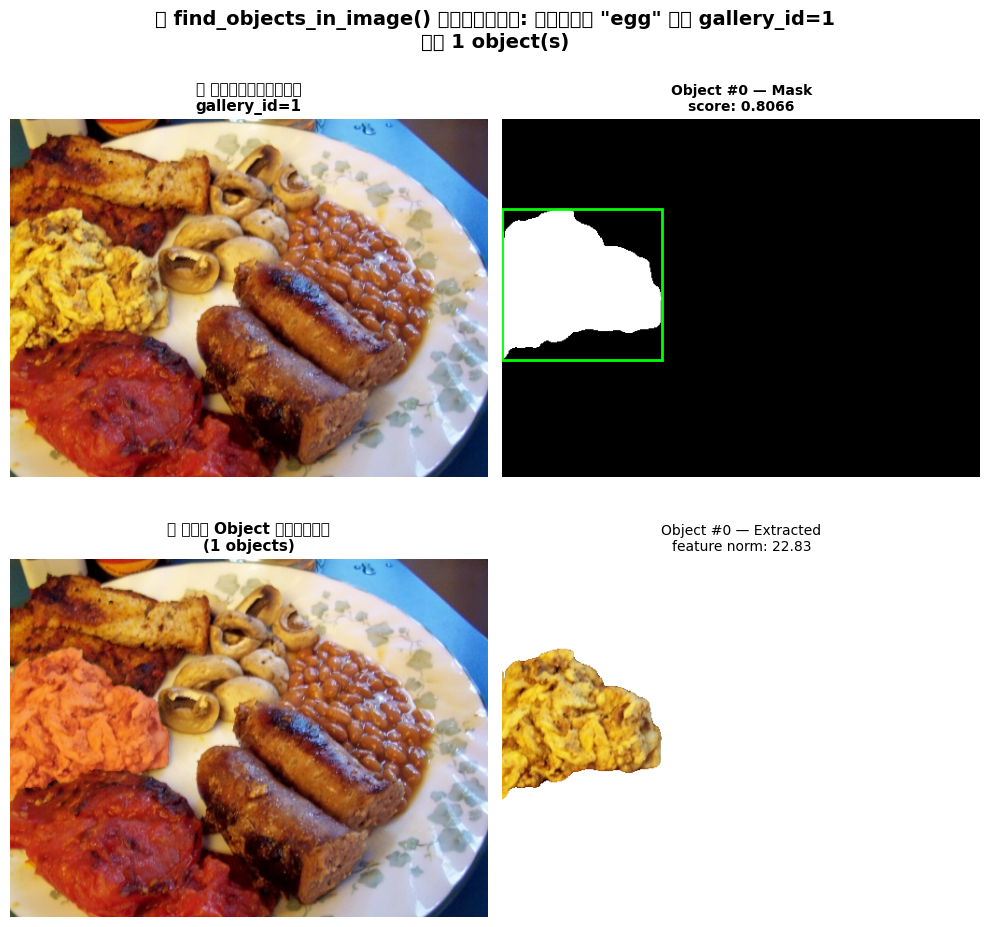

In [15]:
# ============================================================
# Step 5.4.1b: Visualize ผลลัพธ์ของแต่ละ Object ที่พบ
# ============================================================
# แสดงแต่ละ object ที่ฟังก์ชัน return กลับมา

if len(found_objects) > 0:
    n_objs = len(found_objects)
    fig, axes = plt.subplots(2, n_objs + 1, figsize=(5 * (n_objs + 1), 10))

    # ถ้ามี object เดียว ต้องแปลง axes เป็น 2D
    if n_objs == 1:
        axes = axes.reshape(2, -1)

    # --- Column 0: รูปต้นฉบับ ---
    axes[0, 0].imshow(test_image)
    axes[0, 0].set_title(f"📷 รูปต้นฉบับ\ngallery_id={TEST_GALLERY_ID}", fontsize=11, fontweight="bold")
    axes[0, 0].axis("off")

    # Row 1, Col 0: รูปต้นฉบับ + mask overlay ทุก object
    axes[1, 0].imshow(test_image)
    colors_list = [(1, 0.2, 0.2, 0.4), (0.2, 1, 0.2, 0.4), (0.2, 0.2, 1, 0.4),
                   (1, 1, 0.2, 0.4), (1, 0.2, 1, 0.4)]
    for i, obj in enumerate(found_objects):
        overlay = np.zeros((*obj["mask"].shape, 4))
        overlay[obj["mask"]] = colors_list[i % len(colors_list)]
        axes[1, 0].imshow(overlay)
    axes[1, 0].set_title(f"🎨 ทุก Object รวมกัน\n({n_objs} objects)", fontsize=11, fontweight="bold")
    axes[1, 0].axis("off")

    # --- แต่ละ Object ---
    test_arr = np.array(test_image)
    for i, obj in enumerate(found_objects):
        col = i + 1

        # Row 0: Mask ของ object
        axes[0, col].imshow(obj["mask"], cmap="gray")
        box = obj["box"]
        rect = patches.Rectangle(
            (box[0], box[1]), box[2] - box[0], box[3] - box[1],
            linewidth=2, edgecolor="lime", facecolor="none"
        )
        axes[0, col].add_patch(rect)
        axes[0, col].set_title(
            f"Object #{i} — Mask\nscore: {obj['score']:.4f}",
            fontsize=10, fontweight="bold"
        )
        axes[0, col].axis("off")

        # Row 1: Extracted object (ตัดพื้นหลังออก)
        canvas = np.ones_like(test_arr) * 255
        canvas[obj["mask"]] = test_arr[obj["mask"]]
        axes[1, col].imshow(canvas)
        axes[1, col].set_title(
            f"Object #{i} — Extracted\nfeature norm: {np.linalg.norm(obj['feature']):.2f}",
            fontsize=10
        )
        axes[1, col].axis("off")

    plt.suptitle(
        f'🔬 find_objects_in_image() ผลลัพธ์: ค้นหา "{TARGET_FOOD}" ใน gallery_id={TEST_GALLERY_ID}\n'
        f'พบ {n_objs} object(s)',
        fontsize=14, fontweight="bold"
    )
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ ไม่มี object ให้แสดงผล — ลองเปลี่ยน TEST_GALLERY_ID")

In [16]:
# ============================================================
# Step 5.4.1c: ทดลองเปรียบเทียบ Similarity กับ Query Object
# ============================================================
# ตอนนี้เรามี query_feature จาก Step 5.3 แล้ว
# ลองนำ feature ของ object ที่พบมาเปรียบเทียบกับ query ดู

if len(found_objects) > 0:
    print(f"📊 เปรียบเทียบ Cosine Similarity: Query Object vs Objects ใน gallery_id={TEST_GALLERY_ID}")
    print(f"{'='*70}")
    print(f"{'Object':>8} | {'Score':>8} | {'Similarity':>12} | {'ระดับ':>10} | {'Mask Pixels':>12}")
    print(f"{'-'*8}-+-{'-'*8}-+-{'-'*12}-+-{'-'*10}-+-{'-'*12}")

    for i, obj in enumerate(found_objects):
        # คำนวณ cosine similarity
        sim = cosine_similarity(
            query_feature.reshape(1, -1),
            obj["feature"].reshape(1, -1)
        )[0, 0]

        # กำหนดระดับ
        if sim > 0.85:
            level = "🟢 High"
        elif sim > 0.70:
            level = "🟡 Medium"
        else:
            level = "🔴 Low"

        print(f"  #{i:>5} | {obj['score']:>8.4f} | {sim:>12.4f} | {level:>10} | {int(obj['mask'].sum()):>12,}")

    print(f"\n💡 Similarity สูง → object นั้นมีลักษณะคล้ายกับ query object ของเรา")
    print(f"💡 Similarity ต่ำ → อาจเป็นคนละชนิด หรือมุมมอง/ขนาดต่างกันมาก")

📊 เปรียบเทียบ Cosine Similarity: Query Object vs Objects ใน gallery_id=1
  Object |    Score |   Similarity |      ระดับ |  Mask Pixels
---------+----------+--------------+------------+-------------
  #    0 |   0.8066 |       0.9565 |     🟢 High |       18,869

💡 Similarity สูง → object นั้นมีลักษณะคล้ายกับ query object ของเรา
💡 Similarity ต่ำ → อาจเป็นคนละชนิด หรือมุมมอง/ขนาดต่างกันมาก


---
### 📝 สรุปการใช้งาน `find_objects_in_image()`

#### ✅ วิธีเรียกใช้
```python
# 1. เตรียม input
image = ds[idx]["image"].convert("RGB")  # PIL Image
text_prompt = "egg"                       # ชื่อ object ที่จะค้นหา

# 2. เรียกฟังก์ชัน
objects = find_objects_in_image(image, text_prompt, model, processor, device)

# 3. ใช้ผลลัพธ์
for obj in objects:
    mask    = obj["mask"]      # boolean mask (H, W)
    score   = obj["score"]     # confidence 0.0–1.0
    box     = obj["box"]       # [x1, y1, x2, y2]
    feature = obj["feature"]   # feature vector สำหรับ similarity
```

#### ⚠️ กรณีที่ต้องระวัง

| กรณี | สิ่งที่เกิดขึ้น | วิธีแก้ |
|------|----------------|--------|
| ไม่พบ object เลย | return `[]` (list ว่าง) | ลองเปลี่ยน text_prompt หรือลด threshold |
| พบหลาย object | return list หลาย dict | วน loop ดูทีละตัว |
| Mask เล็กเกินไป (<100 px) | ถูกกรองออกอัตโนมัติ | ปกติไม่ต้องแก้ |
| Feature เป็น zero vector | mask ว่างเปล่า | ตรวจสอบ mask ก่อนใช้ feature |

#### 🧪 ลองทดลองเปลี่ยนค่า
1. เปลี่ยน `TEST_GALLERY_ID` → ดูผลลัพธ์กับรูปอื่น
2. เปลี่ยน `TARGET_FOOD` เป็น `"rice"`, `"tomato"` → ค้นหา object อื่น
3. สังเกตว่า score สูง ≠ similarity สูง เสมอไป (score = ความมั่นใจว่าเจอ, similarity = ความคล้าย)

In [17]:
# ============================================================
# Step 5.4.1d: 🧪 ทดลองเปลี่ยน text_prompt (ขั้นสูง)
# ============================================================
# ลองค้นหาด้วย text prompt ที่ต่างกัน เพื่อดูว่าผลต่างกันอย่างไร

PROMPTS_TO_TRY = ["egg", "rice", "tomato"]  # ⬅️ เพิ่ม/เปลี่ยนได้

# ใช้รูปเดิม (TEST_GALLERY_ID)
print(f"📷 ทดสอบหลาย text prompts กับ gallery_id={TEST_GALLERY_ID}")
print(f"   Food classes ในรูป: {test_row['food_classes']}\n")

prompt_results = {}
for prompt in PROMPTS_TO_TRY:
    objs = find_objects_in_image(test_image, prompt, model, processor, device)
    prompt_results[prompt] = objs
    status = f"✅ พบ {len(objs)} object(s)" if len(objs) > 0 else "❌ ไม่พบ"
    print(f'   🔎 text_prompt="{prompt:>10}" → {status}')
    for j, o in enumerate(objs):
        print(f'      └─ obj#{j}: score={o["score"]:.4f}, mask_pixels={int(o["mask"].sum()):,}')

print(f"\n💡 สังเกต: text_prompt ที่ตรงกับ food ในรูปจะพบ object ได้")
print(f"💡 text_prompt ที่ไม่ตรงจะ return list ว่าง []")

📷 ทดสอบหลาย text prompts กับ gallery_id=1
   Food classes ในรูป: soy, egg, steak, sausage, bread, french beans

   🔎 text_prompt="       egg" → ✅ พบ 1 object(s)
      └─ obj#0: score=0.8066, mask_pixels=18,869
   🔎 text_prompt="      rice" → ❌ ไม่พบ
   🔎 text_prompt="    tomato" → ❌ ไม่พบ

💡 สังเกต: text_prompt ที่ตรงกับ food ในรูปจะพบ object ได้
💡 text_prompt ที่ไม่ตรงจะ return list ว่าง []


---
#### ✅ พร้อมแล้ว! เข้าสู่ Step 5.4.2 — ค้นหาข้ามทุกรูปใน Gallery
ตอนนี้เราเข้าใจแล้วว่า `find_objects_in_image()` ทำงานอย่างไร
ขั้นตอนต่อไปคือการนำไปใช้ใน loop เพื่อค้นหาข้ามทุกรูปใน gallery

In [18]:
# ============================================================
# Step 5.4.2: ค้นหาข้ามทุกรูปใน Gallery
# ============================================================
# วน loop ทุกรูป (ยกเว้นรูป query) เพื่อหา object ที่คล้ายกัน

print(f'🔍 เริ่มค้นหา "{TARGET_FOOD}" ข้ามรูปภาพ...')
print(f"   Query : gallery_id={SELECTED_GALLERY_ID}")
print(f"   Search: {len(df_gallery) - 1} รูปที่เหลือ\n")

search_results = []

for _, row in df_gallery.iterrows():
    gid = row["gallery_id"]

    # ข้ามรูป query
    if gid == SELECTED_GALLERY_ID:
        continue

    ds_idx = row["dataset_idx"]
    img = ds[ds_idx]["image"].convert("RGB")

    print(f"   🔎 gallery_id={gid:>2d} (ds_idx={ds_idx}) ...", end=" ")

    # --- หา objects ---
    objects = find_objects_in_image(img, TARGET_FOOD, model, processor, device)

    if len(objects) == 0:
        print("❌ ไม่พบ")
        continue

    # --- คำนวณ Similarity กับ query ---
    for obj_i, obj in enumerate(objects):
        sim = cosine_similarity(
            query_feature.reshape(1, -1),
            obj["feature"].reshape(1, -1),
        )[0, 0]

        search_results.append({
            "gallery_id": gid,
            "dataset_idx": ds_idx,
            "object_idx": obj_i,
            "confidence": obj["score"],
            "similarity": float(sim),
            "mask_pixels": int(obj["mask"].sum()),
            "box": obj["box"],
            "mask": obj["mask"],          # เก็บไว้สำหรับ visualization
            "feature": obj["feature"],
        })

    print(f"✅ พบ {len(objects)} instance(s)")

print(f"\n{'='*50}")
print(f"✅ ค้นหาเสร็จสิ้น: พบ {len(search_results)} objects ทั้งหมด")

🔍 เริ่มค้นหา "egg" ข้ามรูปภาพ...
   Query : gallery_id=0
   Search: 19 รูปที่เหลือ

   🔎 gallery_id= 1 (ds_idx=3140) ... ✅ พบ 1 instance(s)
   🔎 gallery_id= 2 (ds_idx=2838) ... ✅ พบ 5 instance(s)
   🔎 gallery_id= 3 (ds_idx=4194) ... ✅ พบ 1 instance(s)
   🔎 gallery_id= 4 (ds_idx=2414) ... ✅ พบ 9 instance(s)
   🔎 gallery_id= 5 (ds_idx=388) ... ✅ พบ 1 instance(s)
   🔎 gallery_id= 6 (ds_idx=4256) ... ✅ พบ 1 instance(s)
   🔎 gallery_id= 7 (ds_idx=4374) ... ✅ พบ 1 instance(s)
   🔎 gallery_id= 8 (ds_idx=1096) ... ❌ ไม่พบ
   🔎 gallery_id= 9 (ds_idx=2720) ... ✅ พบ 6 instance(s)
   🔎 gallery_id=10 (ds_idx=163) ... ✅ พบ 2 instance(s)
   🔎 gallery_id=11 (ds_idx=3012) ... ✅ พบ 2 instance(s)
   🔎 gallery_id=12 (ds_idx=3424) ... ✅ พบ 2 instance(s)
   🔎 gallery_id=13 (ds_idx=3106) ... ✅ พบ 4 instance(s)
   🔎 gallery_id=14 (ds_idx=2783) ... ✅ พบ 2 instance(s)
   🔎 gallery_id=15 (ds_idx=2716) ... ✅ พบ 1 instance(s)
   🔎 gallery_id=16 (ds_idx=730) ... ✅ พบ 1 instance(s)
   🔎 gallery_id=17 (ds_idx=2477) .

In [19]:
# ============================================================
# Step 5.4.3: สร้าง Similarity DataFrame
# ============================================================
# จัดอันดับผลการค้นหาตาม similarity score

df_results = pd.DataFrame([
    {
        "rank": 0,
        "gallery_id": r["gallery_id"],
        "dataset_idx": r["dataset_idx"],
        "object_idx": r["object_idx"],
        "similarity": r["similarity"],
        "confidence": r["confidence"],
        "mask_pixels": r["mask_pixels"],
    }
    for r in search_results
])

# จัดอันดับตาม similarity (มากไปน้อย)
df_results = df_results.sort_values("similarity", ascending=False).reset_index(drop=True)
df_results["rank"] = df_results.index + 1

print("📊 ผลการค้นหา (เรียงตาม Similarity สูง → ต่ำ):")
print(df_results[["rank", "gallery_id", "similarity", "confidence", "mask_pixels"]].to_string(index=False))

📊 ผลการค้นหา (เรียงตาม Similarity สูง → ต่ำ):
 rank  gallery_id  similarity  confidence  mask_pixels
    1           3    0.963302    0.836951        16627
    2          16    0.963021    0.581648        27736
    3          17    0.960391    0.929315        37909
    4           1    0.956500    0.806611        18869
    5          19    0.954291    0.901949        18423
    6          18    0.950485    0.814266        68900
    7          12    0.932241    0.755164        14939
    8          15    0.930973    0.960708        61573
    9          13    0.926918    0.935936        40510
   10           9    0.925782    0.918179         8331
   11          11    0.924559    0.943869         9458
   12          13    0.922677    0.956417        30015
   13          13    0.921434    0.955995        36402
   14          11    0.919820    0.961770         9769
   15          10    0.918645    0.951963         6691
   16          12    0.916022    0.329593        15179
   17          14  

---
# 🟢 Step 5.5: แสดงผล Similarity ข้ามรูปภาพ

### 🎯 เป้าหมาย
1. แสดง Query Object เทียบกับ Top-N objects ที่คล้ายที่สุด
2. แสดง similarity bar chart
3. แสดง similarity matrix

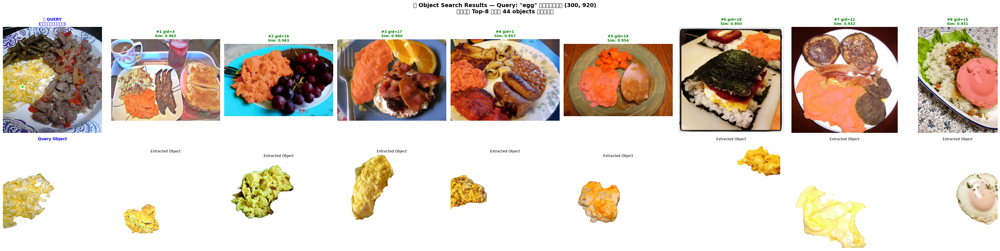

In [20]:
# ============================================================
# Step 5.5.1: แสดง Top-N Similar Objects
# ============================================================
TOP_N = min(8, len(search_results))

# --- จัดเรียง results ตาม similarity ---
sorted_results = sorted(search_results, key=lambda x: x["similarity"], reverse=True)

fig, axes = plt.subplots(2, TOP_N + 1, figsize=(4 * (TOP_N + 1), 9))

# === Row 0: รูปต้นฉบับ + จุดที่คลิก / รูปผลการค้นหา ===
# Query image
axes[0, 0].imshow(query_image)
axes[0, 0].scatter(CLICK_POINT[0], CLICK_POINT[1], c="lime", s=300, marker="*",
                   edgecolors="white", linewidths=2, zorder=5)
axes[0, 0].set_title("🎯 QUERY\n(รูปที่คลิก)", fontsize=10, fontweight="bold", color="blue")
axes[0, 0].axis("off")

# Query extracted object
canvas_q = np.ones_like(np.array(query_image)) * 255
canvas_q[query_mask] = np.array(query_image)[query_mask]
axes[1, 0].imshow(canvas_q)
axes[1, 0].set_title("Query Object", fontsize=10, fontweight="bold", color="blue")
axes[1, 0].axis("off")

# Top-N results
for i in range(TOP_N):
    res = sorted_results[i]
    gid = res["gallery_id"]
    ds_idx = res["dataset_idx"]
    sim = res["similarity"]
    mask = res["mask"]
    img = ds[ds_idx]["image"].convert("RGB")
    img_arr = np.array(img)

    # Row 0: รูปต้นฉบับ + mask overlay
    axes[0, i + 1].imshow(img)
    overlay = np.zeros((*mask.shape, 4))
    overlay[mask] = [1, 0.2, 0.2, 0.5]
    axes[0, i + 1].imshow(overlay)

    # สีตาม similarity
    color = "green" if sim > 0.85 else "orange" if sim > 0.7 else "red"
    axes[0, i + 1].set_title(f"#{i+1} gid={gid}\nSim: {sim:.3f}",
                              fontsize=9, fontweight="bold", color=color)
    axes[0, i + 1].axis("off")

    # Row 1: Extracted object
    canvas = np.ones_like(img_arr) * 255
    canvas[mask] = img_arr[mask]
    axes[1, i + 1].imshow(canvas)
    axes[1, i + 1].set_title(f"Extracted Object", fontsize=9)
    axes[1, i + 1].axis("off")

plt.suptitle(f'🔍 Object Search Results — Query: "{TARGET_FOOD}" คลิกที่ ({CLICK_POINT[0]}, {CLICK_POINT[1]})\n'
             f'แสดง Top-{TOP_N} จาก {len(search_results)} objects ที่พบ',
             fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

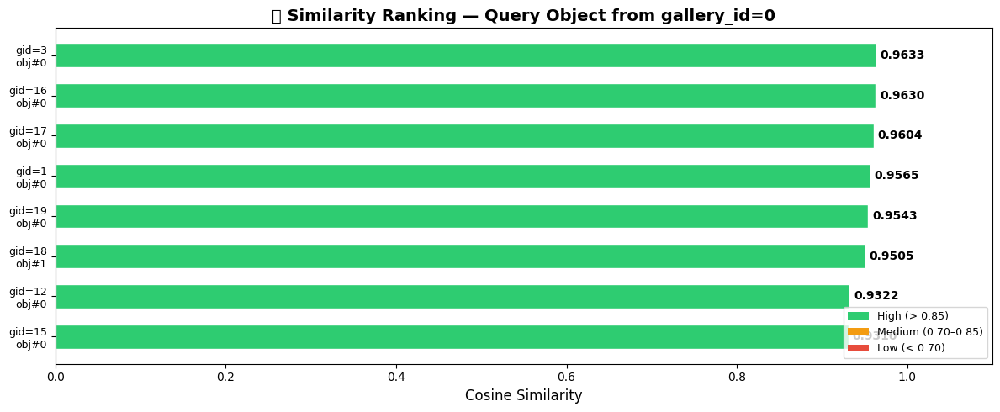

In [21]:
# ============================================================
# Step 5.5.2: Similarity Bar Chart
# ============================================================
fig, ax = plt.subplots(figsize=(12, 5))

# เตรียมข้อมูล
labels = [f"gid={r['gallery_id']}\nobj#{r['object_idx']}" for r in sorted_results[:TOP_N]]
sims = [r["similarity"] for r in sorted_results[:TOP_N]]
colors = ["#2ecc71" if s > 0.85 else "#f39c12" if s > 0.7 else "#e74c3c" for s in sims]

bars = ax.barh(range(len(labels)), sims, color=colors, edgecolor="white", height=0.6)

# เพิ่ม value labels
for bar, sim in zip(bars, sims):
    ax.text(bar.get_width() + 0.005, bar.get_y() + bar.get_height() / 2,
            f"{sim:.4f}", va="center", fontsize=10, fontweight="bold")

ax.set_yticks(range(len(labels)))
ax.set_yticklabels(labels, fontsize=9)
ax.set_xlabel("Cosine Similarity", fontsize=12)
ax.set_title(f'📊 Similarity Ranking — Query Object from gallery_id={SELECTED_GALLERY_ID}',
             fontsize=14, fontweight="bold")
ax.set_xlim(0, 1.1)
ax.invert_yaxis()

# Legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor="#2ecc71", label="High (> 0.85)"),
    Patch(facecolor="#f39c12", label="Medium (0.70–0.85)"),
    Patch(facecolor="#e74c3c", label="Low (< 0.70)"),
]
ax.legend(handles=legend_elements, loc="lower right", fontsize=9)

plt.tight_layout()
plt.show()

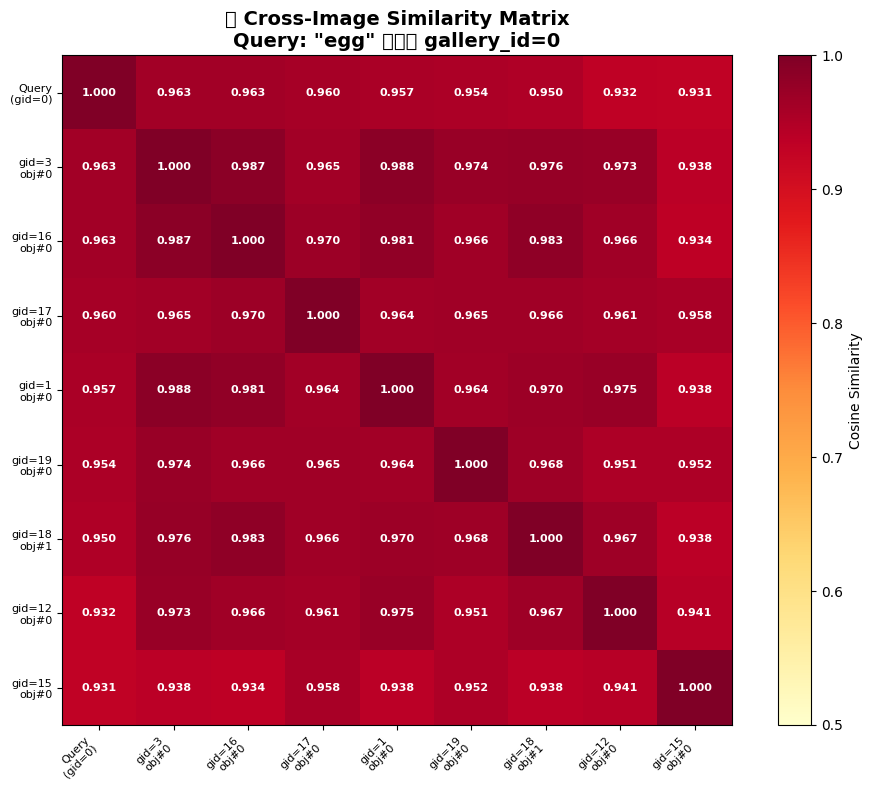

In [22]:
# ============================================================
# Step 5.5.3: Similarity Heatmap ข้ามรูป (Cross-Image Matrix)
# ============================================================
# สร้าง similarity matrix ระหว่าง query กับ top results

n_show = min(TOP_N, 10)
top_features = [query_feature] + [r["feature"] for r in sorted_results[:n_show]]
top_labels = [f"Query\n(gid={SELECTED_GALLERY_ID})"] + \
             [f"gid={r['gallery_id']}\nobj#{r['object_idx']}" for r in sorted_results[:n_show]]

# คำนวณ pairwise similarity matrix
feat_matrix = np.stack(top_features)
sim_matrix = cosine_similarity(feat_matrix)

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(sim_matrix, cmap="YlOrRd", vmin=0.5, vmax=1.0)
plt.colorbar(im, ax=ax, label="Cosine Similarity")

# Labels
ax.set_xticks(range(len(top_labels)))
ax.set_yticks(range(len(top_labels)))
ax.set_xticklabels(top_labels, fontsize=8, rotation=45, ha="right")
ax.set_yticklabels(top_labels, fontsize=8)

# ใส่ตัวเลขในแต่ละ cell
for i in range(len(top_labels)):
    for j in range(len(top_labels)):
        color = "white" if sim_matrix[i, j] > 0.85 else "black"
        ax.text(j, i, f"{sim_matrix[i, j]:.3f}", ha="center", va="center",
                fontsize=8, color=color, fontweight="bold")

ax.set_title(f"🗺️ Cross-Image Similarity Matrix\n"
             f'Query: "{TARGET_FOOD}" จาก gallery_id={SELECTED_GALLERY_ID}',
             fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

In [23]:
# ============================================================
# Step 5.5.4: สรุปผลลัพธ์ใน DataFrame
# ============================================================
print("=" * 70)
print(f'📋 สรุปผลการค้นหา Object: "{TARGET_FOOD}"')
print(f"   Query Image    : gallery_id={SELECTED_GALLERY_ID}")
print(f"   Click Position : ({CLICK_POINT[0]}, {CLICK_POINT[1]})")
print(f"   Objects Found  : {len(search_results)} ใน {len(df_gallery) - 1} รูป")
print("=" * 70)

# แสดง DataFrame สรุป
df_summary = df_results[["rank", "gallery_id", "similarity", "confidence", "mask_pixels"]].copy()
df_summary["similarity_level"] = df_summary["similarity"].apply(
    lambda s: "🟢 High" if s > 0.85 else "🟡 Medium" if s > 0.7 else "🔴 Low"
)

print("\n📊 Similarity Ranking Table:")
print(df_summary.to_string(index=False))

📋 สรุปผลการค้นหา Object: "egg"
   Query Image    : gallery_id=0
   Click Position : (300, 920)
   Objects Found  : 44 ใน 19 รูป

📊 Similarity Ranking Table:
 rank  gallery_id  similarity  confidence  mask_pixels similarity_level
    1           3    0.963302    0.836951        16627           🟢 High
    2          16    0.963021    0.581648        27736           🟢 High
    3          17    0.960391    0.929315        37909           🟢 High
    4           1    0.956500    0.806611        18869           🟢 High
    5          19    0.954291    0.901949        18423           🟢 High
    6          18    0.950485    0.814266        68900           🟢 High
    7          12    0.932241    0.755164        14939           🟢 High
    8          15    0.930973    0.960708        61573           🟢 High
    9          13    0.926918    0.935936        40510           🟢 High
   10           9    0.925782    0.918179         8331           🟢 High
   11          11    0.924559    0.943869         9

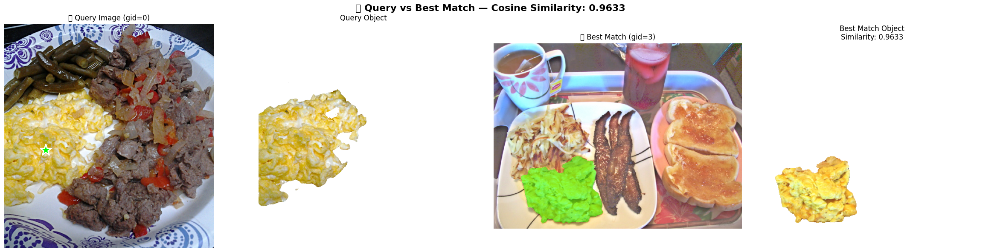

In [24]:
# ============================================================
# Step 5.5.5: Detailed Side-by-Side: Query vs Best Match
# ============================================================
if len(sorted_results) > 0:
    best = sorted_results[0]
    best_img = ds[best["dataset_idx"]]["image"].convert("RGB")
    best_arr = np.array(best_img)
    best_mask = best["mask"]

    fig, axes = plt.subplots(1, 4, figsize=(24, 6))

    # Panel 1: Query Image
    axes[0].imshow(query_image)
    axes[0].scatter(CLICK_POINT[0], CLICK_POINT[1], c="lime", s=400, marker="*",
                    edgecolors="white", linewidths=2, zorder=5)
    axes[0].set_title(f"🎯 Query Image (gid={SELECTED_GALLERY_ID})", fontsize=12)
    axes[0].axis("off")

    # Panel 2: Query Object (extracted)
    canvas_q = np.ones_like(np.array(query_image)) * 255
    canvas_q[query_mask] = np.array(query_image)[query_mask]
    axes[1].imshow(canvas_q)
    axes[1].set_title("Query Object", fontsize=12)
    axes[1].axis("off")

    # Panel 3: Best Match Image
    axes[2].imshow(best_img)
    overlay = np.zeros((*best_mask.shape, 4))
    overlay[best_mask] = [0, 1, 0, 0.45]
    axes[2].imshow(overlay)
    axes[2].set_title(f"🏆 Best Match (gid={best['gallery_id']})", fontsize=12)
    axes[2].axis("off")

    # Panel 4: Best Match Object (extracted)
    canvas_b = np.ones_like(best_arr) * 255
    canvas_b[best_mask] = best_arr[best_mask]
    axes[3].imshow(canvas_b)
    axes[3].set_title(f"Best Match Object\nSimilarity: {best['similarity']:.4f}", fontsize=12)
    axes[3].axis("off")

    plt.suptitle(f"🔍 Query vs Best Match — Cosine Similarity: {best['similarity']:.4f}",
                 fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

---
# 🎓 Lab 5 Summary

## สิ่งที่ได้เรียนรู้

| Step | หัวข้อ | Key Takeaway |
|------|--------|--------------|
| **5.1** | Setup & Gallery | สร้าง pandas DataFrame เป็น image gallery สำหรับเลือกรูป |
| **5.2** | Point Click | คลิก (x,y) → SAM 3 segment → ได้ mask ของ object |
| **5.3** | Feature Extraction | ใช้ SAM 3 Vision Encoder สกัด feature vector จาก masked object |
| **5.4** | Cross-Image Search | วน loop ค้นหา object คล้ายๆ กันในรูปอื่น ด้วย cosine similarity |
| **5.5** | Visualization | แสดงผลเป็น ranking, bar chart, heatmap |

## Pipeline สรุป

```
┌──────────────┐    ┌───────────────┐    ┌────────────────┐
│ เลือกรูปจาก  │ →  │ คลิก point    │ →  │ SAM 3 Segment  │
│ pandas gallery│    │ บน object     │    │ → mask + crop  │
└──────────────┘    └───────────────┘    └────────────────┘
                                                 │
                                                 ▼
┌──────────────┐    ┌───────────────┐    ┌────────────────┐
│ จัดอันดับ    │ ←  │ Cosine        │ ←  │ Vision Encoder │
│ Similarity   │    │ Similarity    │    │ → Feature Vec  │
└──────────────┘    └───────────────┘    └────────────────┘
```

## 🧪 ลองเปลี่ยนค่าดู!

1. เปลี่ยน `TARGET_FOOD = "rice"` หรือ `"tomato"` → ค้นหา object ชนิดอื่น
2. เปลี่ยน `SELECTED_GALLERY_ID` → เลือกรูปอื่นเป็น query
3. เปลี่ยน `CLICK_POINT` → คลิกที่ object อื่นในรูปเดียวกัน
4. เพิ่ม `MAX_GALLERY = 50` → ค้นหาใน gallery ที่ใหญ่ขึ้น
5. ลอง threshold อื่น เช่น `threshold=0.1` → ดูว่าเจอ object เพิ่มไหม